# Processing the QC file we created from the raw Single Cell data in to clusters

## Imports

In [1]:
import numpy as np
import scanpy as sc
import os
import pandas as pd
import bbknn

## Single Cell settings

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(80) 
sc.settings.file_format_figures = 'png'
sc.settings.savefigs = False
use_first_n_samples = 0
full_sparse = False

C:\Users\TzachiHNB12\AppData\Local\Temp\ipykernel_10516\738880785.py:2: FutureWarning: The specified parameters ('scanpy',) are no longer positional. Please specify them like `scanpy=80`
  sc.settings.set_figure_params(80)


## Defining a function for processing the data & determing the parameters

In [3]:
def processing_batch(adata, neighbors=15, key='batch', reso=0.4):  # Higher resolution yields more leiden clusters 
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack', random_state=8)
    sc.logging.print_memory_usage()
    sc.pp.neighbors(adata, n_neighbors=neighbors, random_state=8)
    sc.pl.pca_variance_ratio(adata, log=True)
    bbknn.bbknn(adata, batch_key=key, neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
    sc.tl.umap(adata, random_state=8)
    sc.tl.leiden(adata, resolution=reso, random_state=8)
    sc.pl.umap(adata, color='leiden')

## Reading the excisting h5ad file we created previously, in the QC pipeline 

In [4]:
#adata after QC
adata = sc.read(r'/Code/data/single_cell/animals/crocodile/crocodile_3/''crocodile_3_after_qc.h5ad') 

sc.read_h5ad(r'/Code/data/single_cell/animals/crocodile/crocodile_3/''crocodile_3_after_qc.h5ad')

AnnData object with n_obs × n_vars = 26432 × 9023
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'n_cells', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

## Processing the data 

In [5]:
adata

AnnData object with n_obs × n_vars = 26432 × 9023
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'n_cells', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

In [6]:
adata.obs

,treatment,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,S_score,G2M_score,phase
AAACCCAGTATCACGT-1-control,control,660,660,2319.0,0.0,0.0,-0.182143,0.213951,G2M
AAACCCAGTCACTACA-1-control,control,873,873,3415.0,0.0,0.0,-0.078551,-0.126964,G1
AAACCCAGTTTGCAGT-1-control,control,523,523,907.0,0.0,0.0,-0.311757,-0.077434,G1
AAACGAAAGGCTAAAT-1-control,control,837,837,2047.0,0.0,0.0,-0.233329,-0.162777,G1
AAACGAACAACTCGTA-1-control,control,517,517,2226.0,0.0,0.0,-0.106891,0.112648,G2M
...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAACCCTA-1-pic,pic,357,357,1639.0,0.0,0.0,-0.142458,-0.056265,G1
TTTGTTGGTACAAGCG-1-pic,pic,437,437,990.0,0.0,0.0,-0.235150,-0.135971,G1
TTTGTTGGTTTCCATT-1-pic,pic,437,437,905.0,0.0,0.0,-0.089621,-0.049433,G1
TTTGTTGTCCTCACCA-1-pic,pic,662,662,1118.0,0.0,0.0,-0.062416,-0.159452,G1


In [7]:
adata.var

,gene_ids,feature_types,n_cells,MT,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
gene_name,,,,,,,,
HMGX4,TRINITY_DN684_c0_g2,Gene Expression,5363,False,5363,0.229290,81.419118,6618.0
ZN540,TRINITY_DN1733_c2_g1,Gene Expression,130,False,130,0.004504,99.549596,130.0
1B04,TRINITY_DN1037_c5_g6,Gene Expression,1997,False,1997,0.072931,93.081107,2105.0
CRADD,TRINITY_DN1973_c0_g1,Gene Expression,2127,False,2127,0.082147,92.630704,2371.0
ZN362,TRINITY_DN1113_c0_g3,Gene Expression,305,False,305,0.010844,98.943284,313.0
...,...,...,...,...,...,...,...,...
ENTP4,TRINITY_DN4958_c0_g2,Gene Expression,628,False,628,0.022555,97.824204,651.0
NEPRO-1,TRINITY_DN4017_c0_g1,Gene Expression,72,False,72,0.002495,99.750546,72.0
TBCD8-5,TRINITY_DN3760_c1_g1,Gene Expression,408,False,408,0.014690,98.586426,424.0


### Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    Gene indices [1361 8448] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


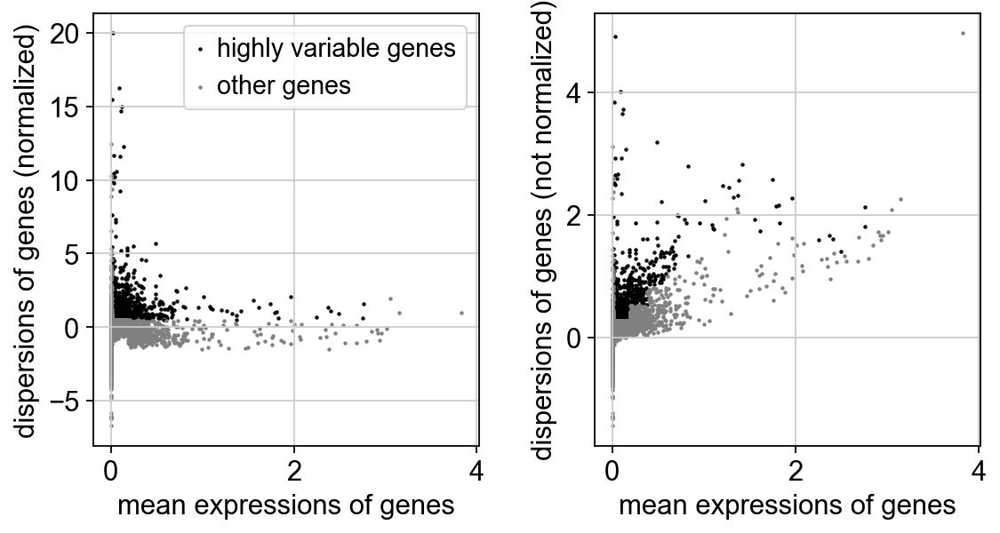

In [8]:
# Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations.

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata

In [9]:
sc.pp.regress_out(adata, ['total_counts','pct_counts_MT'])

# Got it from: https://github.com/theislab/single-cell-tutorial/issues/35
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata) 

regressing out ['total_counts', 'pct_counts_MT']
    sparse input is densified and may lead to high memory use
    finished (0:10:44)
    ... clipping at max_value 10
computing PCA


c:\Python\Python312\Lib\site-packages\scanpy\preprocessing\_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    with n_comps=50
    finished (0:00:08)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:01:04)
    computed connectivities (0:00:04)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:08)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:42)


    ... clipping at max_value 10
computing PCA
    with n_comps=50
    finished (0:00:06)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
Memory usage: current 2.57 GB, difference +2.57 GB
computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:06)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)


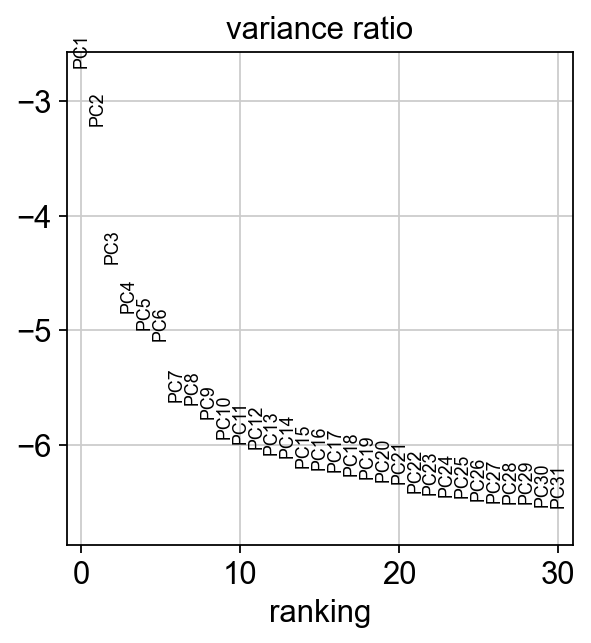

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:35)
running Leiden clustering


C:\Users\TzachiHNB12\AppData\Local\Temp\ipykernel_10516\1898756374.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=reso, random_state=8)


    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


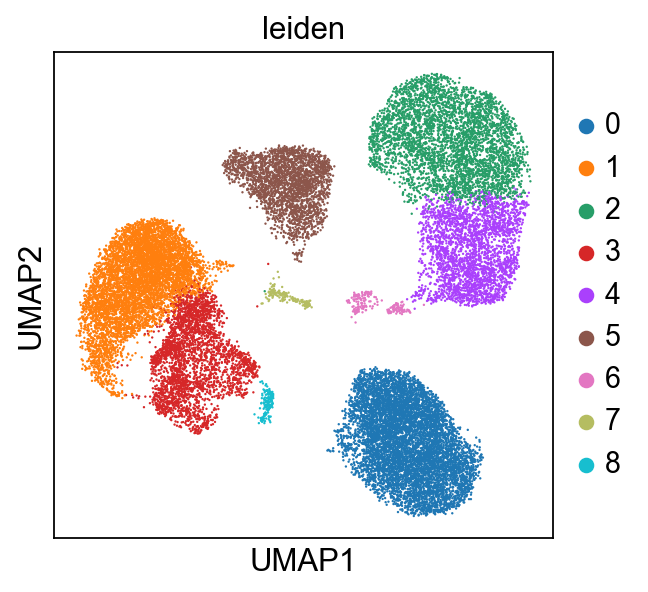

In [10]:
processing_batch(adata, key='treatment')

### Ranking genes ( = top 20)

ranking genes
    consider 'treatment' groups:
    with sizes: [5772 6244 7979 6437]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:49)


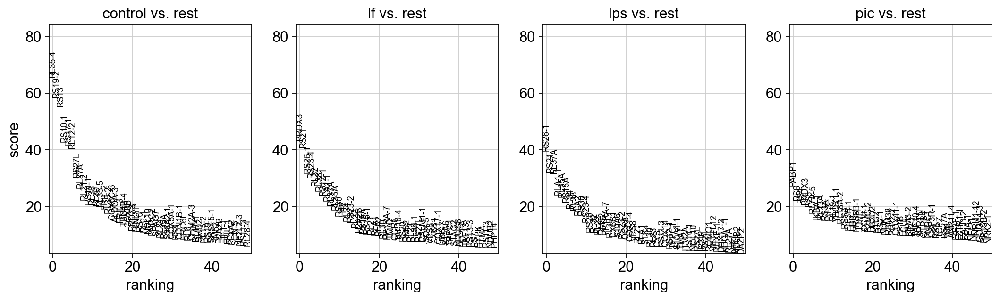

,control,lf,lps,pic
0,RL35-4,PRDX3,RS26-1,PABP1
1,RS19-2,RS21,RS21,RS6
2,RS13,RS26-1,RL37A,RS4
3,RS10-1,RS23-4,RLA1-1,PRDX3
4,RS17-1,RL32,RL35A,RS5
5,RL12-2,RL38,RS15A,RL7A-5
6,RS27L,RS12-1,RL34,IKBA-1
7,RL37A,RLA1-1,RL38,RL13A
8,RL21-2,RL37A,RLA2,RS3A
9,RS14-1,RL35A,RS30,EIF3E


In [11]:
sc.tl.rank_genes_groups(adata, groupby='treatment', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=True)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

In [12]:
adata.obs['treatment'].value_counts()

treatment
lps        7979
pic        6437
lf         6244
control    5772
Name: count, dtype: int64

### UMAP's

#### T cells

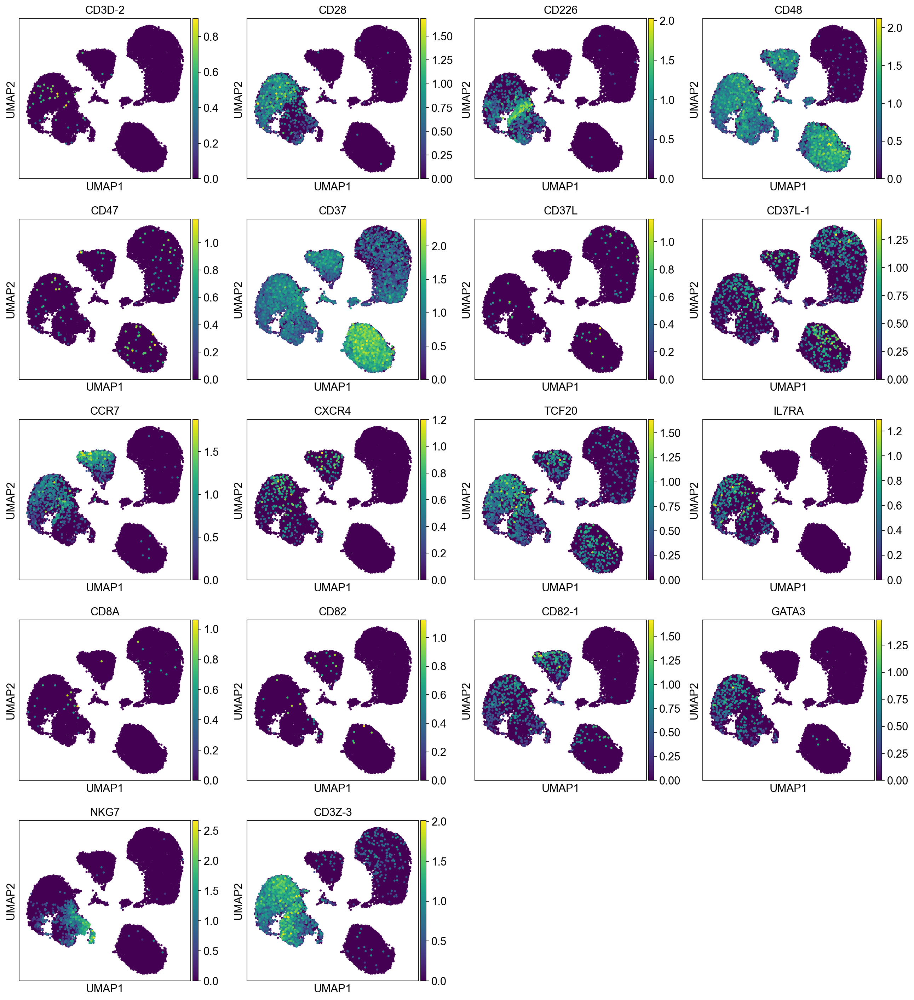

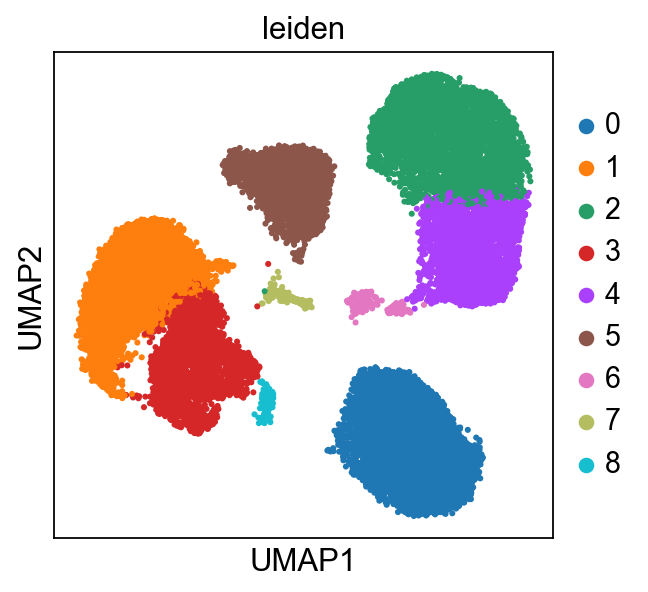

In [13]:
sc.pl.umap(adata, color=['CD3D-2','CD28','CD226','CD48','CD47','CD37','CD37L','CD37L-1',
                         'CCR7','CXCR4','TCF20','IL7RA','CD8A','CD82','CD82-1','GATA3',
                         'NKG7','CD3Z-3'], size=30)

sc.pl.umap(adata, color='leiden', size=30)

#### B cells

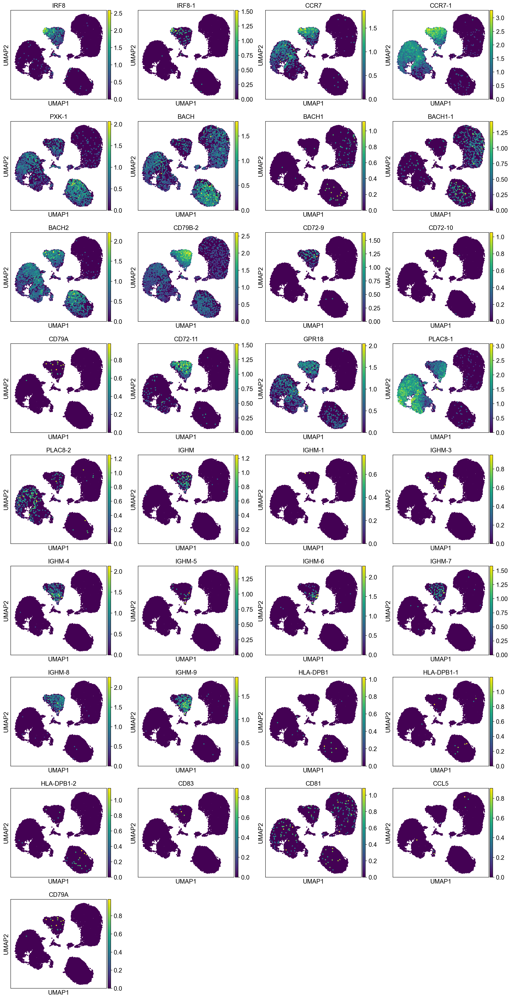

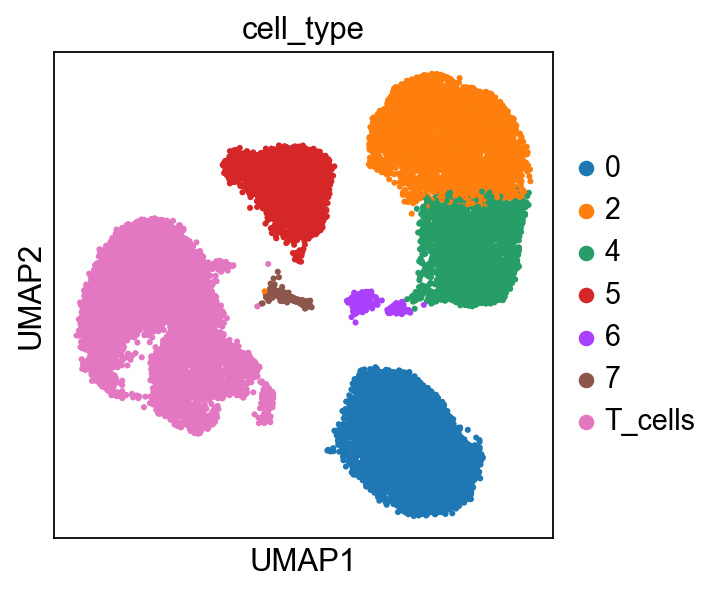

In [46]:
sc.pl.umap(adata, color=['IRF8','IRF8-1','CCR7','CCR7-1','PXK-1','BACH','BACH1','BACH1-1',
                         'BACH2','CD79B-2','CD72-9','CD72-10','CD79A','CD72-11','GPR18',
                         'PLAC8-1','PLAC8-2','IGHM','IGHM-1','IGHM-3','IGHM-4','IGHM-5',
                         'IGHM-6','IGHM-7','IGHM-8','IGHM-9','HLA-DPB1','HLA-DPB1-1',
                         'HLA-DPB1-2','CD83','CD81','CCL5','CD79A'], size=30)

celltype = {'0':'0','1':'T_cells','2':'2','3':'T_cells','4':'4','5':'5','6':'6','7':'7','8':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### RBC

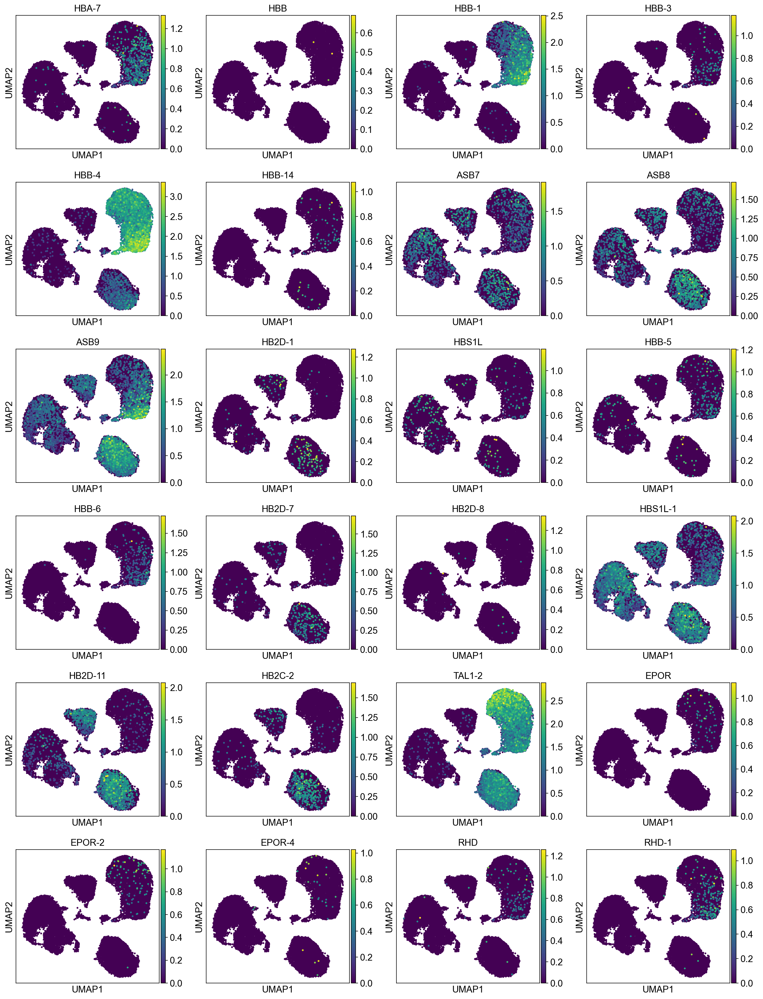

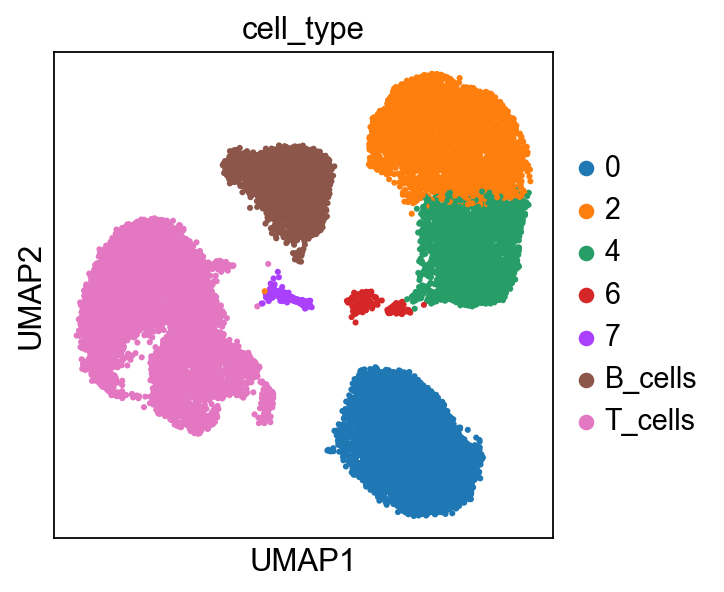

In [47]:
sc.pl.umap(adata, color=['HBA-7','HBB','HBB-1','HBB-3','HBB-4','HBB-14','ASB7','ASB8','ASB9',
                         'HB2D-1','HBS1L','HBB-5','HBB-6','HB2D-7','HB2D-8','HBS1L-1','HB2D-11',
                         'HB2C-2','TAL1-2','EPOR','EPOR-2','EPOR-4','RHD','RHD-1'], size=30)
 
celltype = {'0':'0','1':'T_cells','2':'2','3':'T_cells','4':'4','5':'B_cells','6':'6','7':'7','8':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### Monocytes

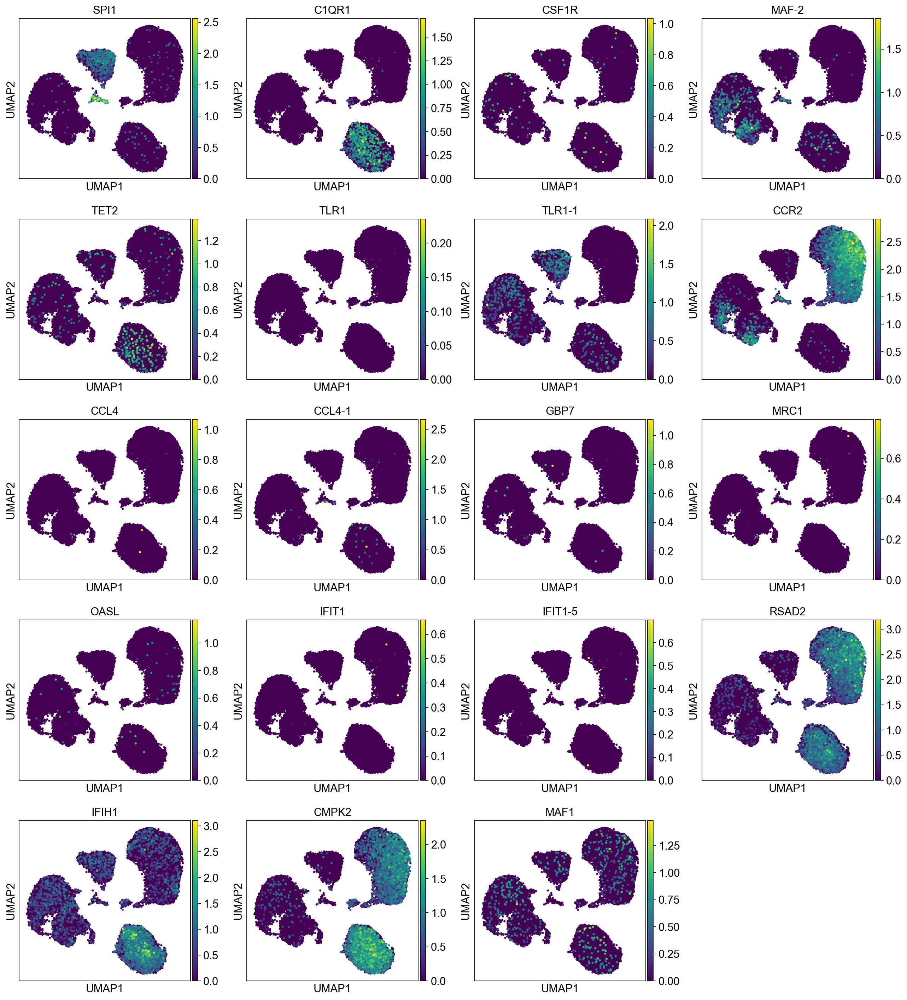

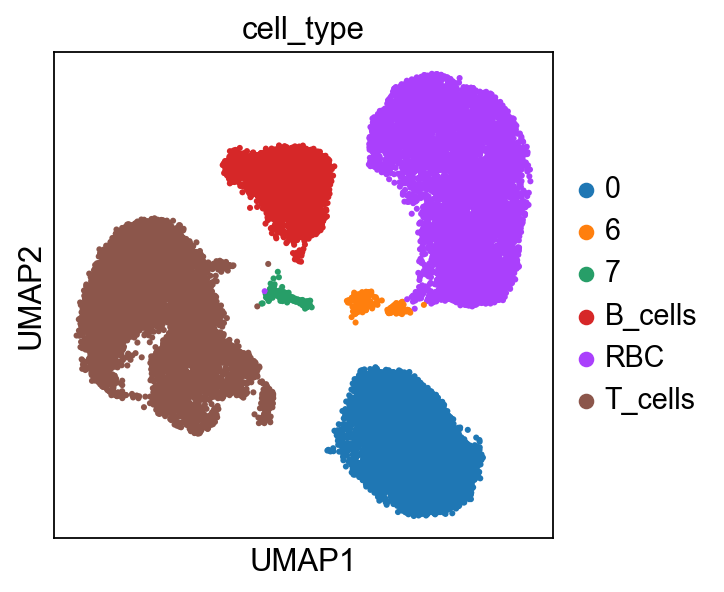

In [48]:
sc.pl.umap(adata, color=['SPI1','C1QR1','CSF1R','MAF-2','TET2','TLR1','TLR1-1',
                         'CCR2','CCL4','CCL4-1','GBP7','MRC1','OASL','IFIT1',
                         'IFIT1-5','RSAD2','IFIH1','CMPK2','MAF1'], size=30)

celltype = {'0':'0','1':'T_cells','2':'RBC','3':'T_cells','4':'RBC','5':'B_cells','6':'6','7':'7','8':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### Platelets

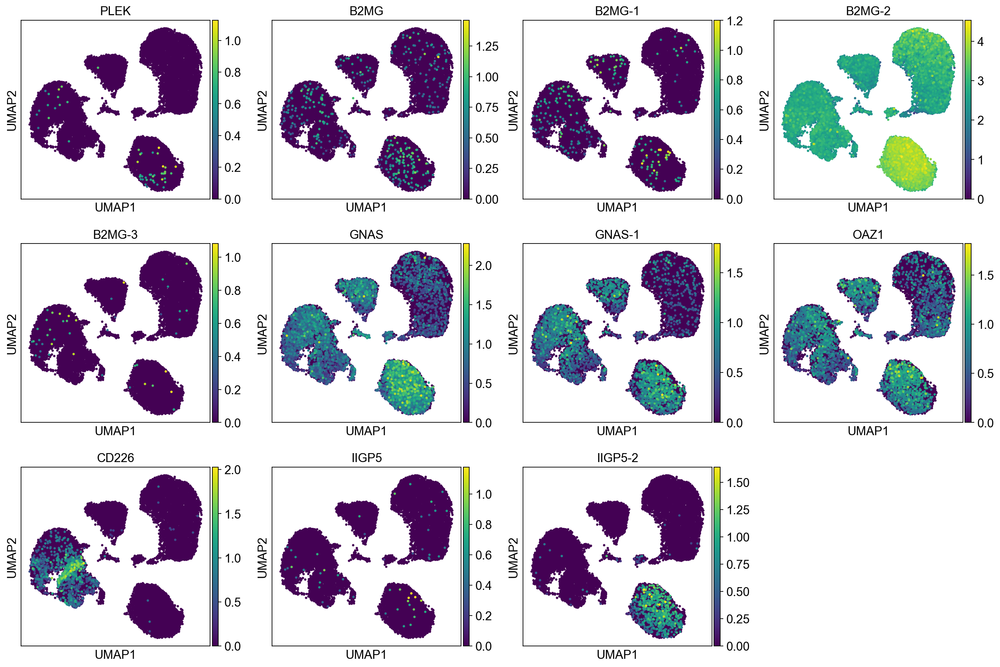

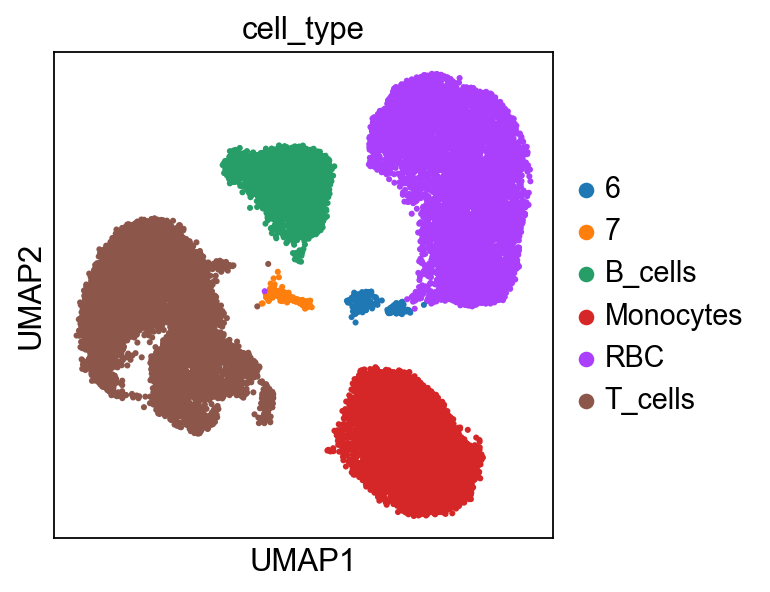

In [49]:
sc.pl.umap(adata, color=['PLEK','B2MG','B2MG-1','B2MG-2','B2MG-3','GNAS','GNAS-1','OAZ1','CD226','IIGP5','IIGP5-2'], size=30)

celltype = {'0':'Monocytes','1':'T_cells','2':'RBC','3':'T_cells','4':'RBC','5':'B_cells','6':'6','7':'7','8':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### All clusters

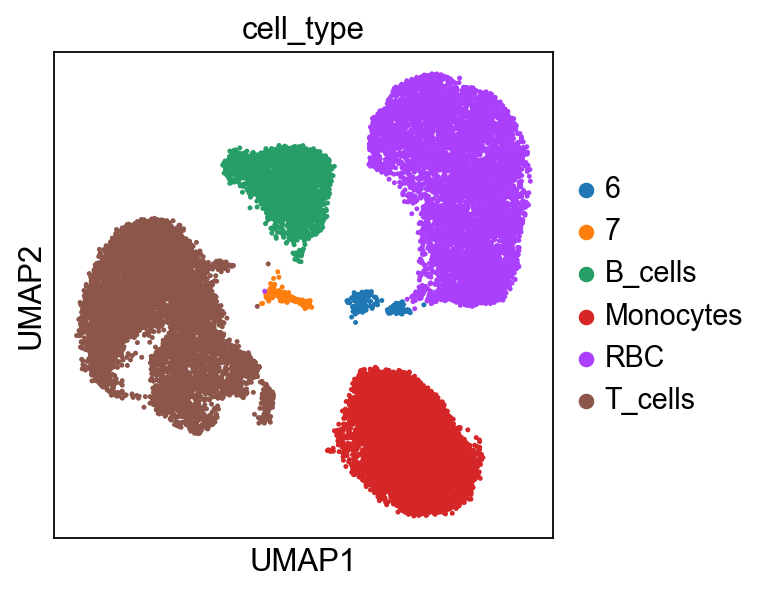

In [50]:
celltype = {'0':'Monocytes','1':'T_cells','2':'RBC','3':'T_cells','4':'RBC','5':'B_cells','6':'6','7':'7','8':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

In [51]:
adata.obs['cell_type']

AAACCCAGTATCACGT-1-control          RBC
AAACCCAGTCACTACA-1-control      T_cells
AAACCCAGTTTGCAGT-1-control    Monocytes
AAACGAAAGGCTAAAT-1-control    Monocytes
AAACGAACAACTCGTA-1-control          RBC
                                ...    
TTTGTTGGTAACCCTA-1-pic              RBC
TTTGTTGGTACAAGCG-1-pic          T_cells
TTTGTTGGTTTCCATT-1-pic          T_cells
TTTGTTGTCCTCACCA-1-pic        Monocytes
TTTGTTGTCGTCCTCA-1-pic        Monocytes
Name: cell_type, Length: 26432, dtype: category
Categories (6, object): ['6', '7', 'B_cells', 'Monocytes', 'RBC', 'T_cells']

### Saving adata.obs to csv

In [52]:
adata.obs.to_csv(r'/Code/data/single_cell/animals/crocodile/crocodile_3/''crocodile_3_obs.csv')

#### TLR genes in adata by treatment

In [19]:
TLR_genes = ['TLRN1', 'TLRN1-1', 'TLR1', 'TLR13', 'TLR1-1']

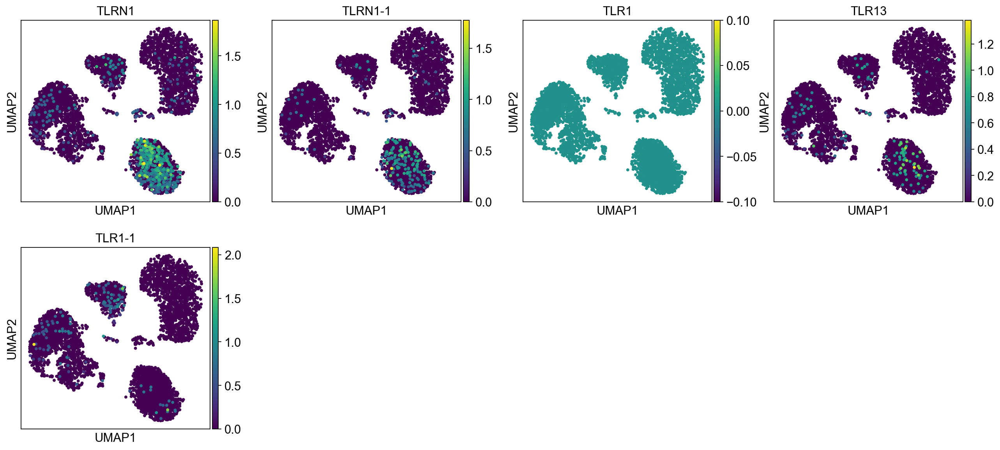

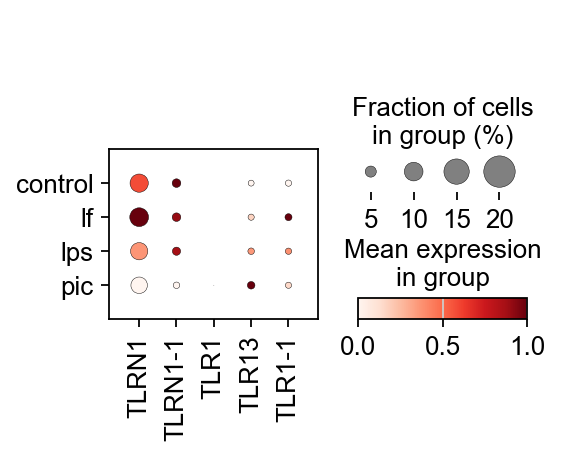

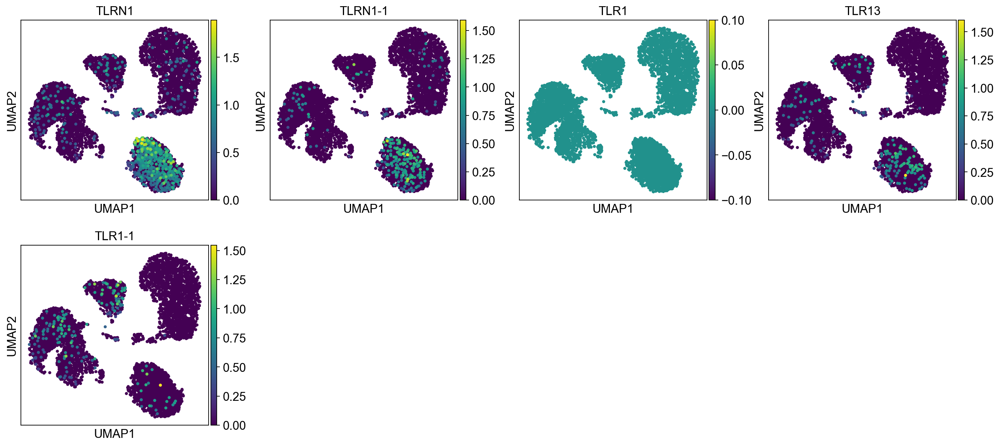

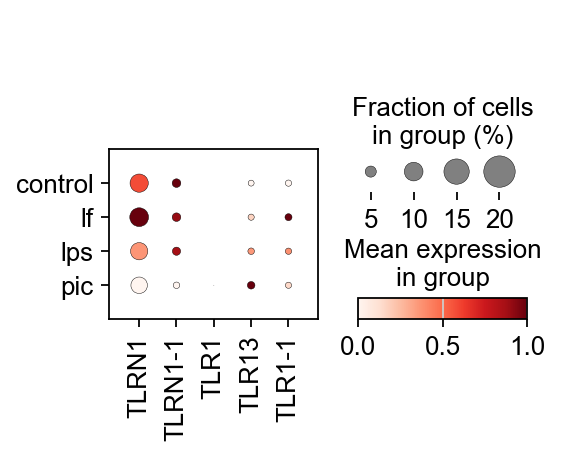

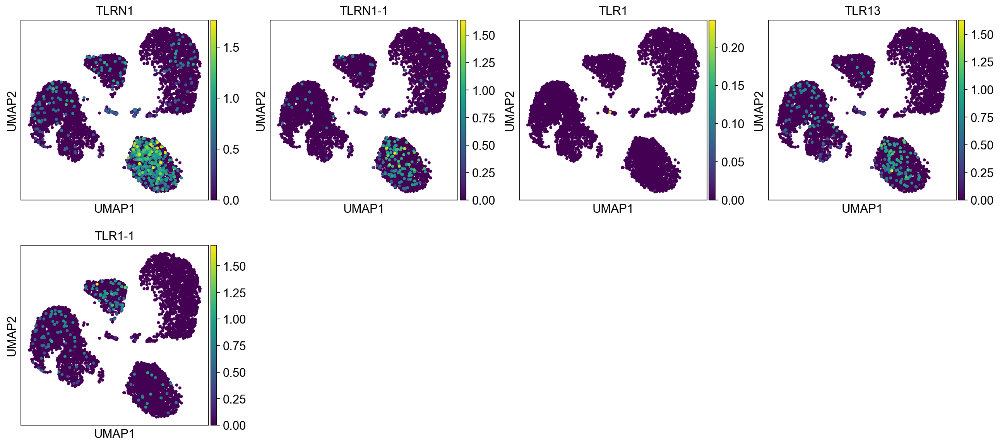

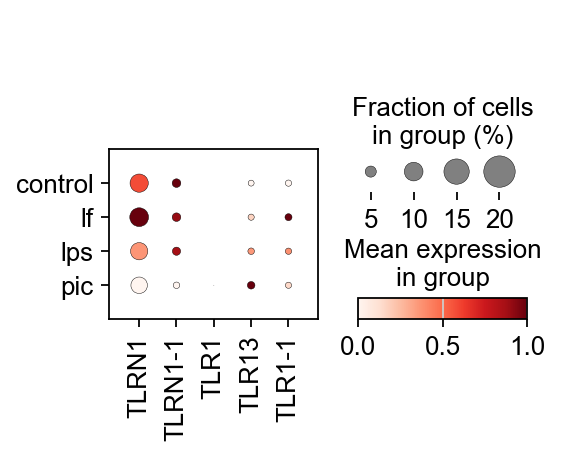

In [20]:
sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'lps'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'pic'], color=TLR_genes, size=50)
sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

In [21]:
adata.obs['cell_type'].value_counts()

cell_type
Monocytes    7661
RBCs         6704
1            6134
3            3022
B_cells      2563
6             196
8             152
Name: count, dtype: int64

#### Checking markers

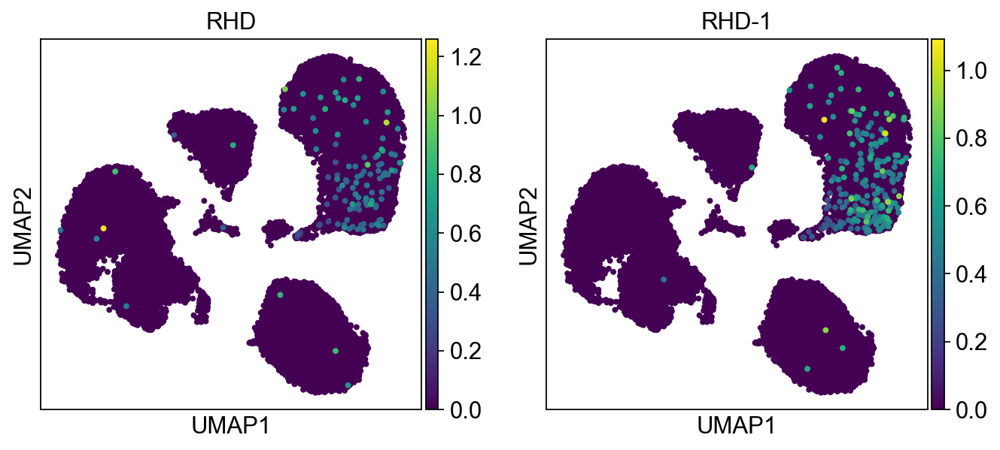

In [22]:
sc.pl.umap(adata, color=['RHD', 'RHD-1'], size=50)

### ISG genes 

In [23]:
df_isg_genes = pd.read_csv('/Code/data/single_cell/animals/crocodile/crocodile_3/isg_genes_croc_3.csv', index_col=0)
df_isg_genes = df_isg_genes.sort_index()

df_isg_genes

""
names
AZI2
B2MG
B2MG-1
B2MG-2
B2MG-3
CASP8
CD47
CD47-1
CD47-2


In [24]:
isg_genes_list = df_isg_genes.index.tolist()
isg_genes_list

['AZI2',
 'B2MG',
 'B2MG-1',
 'B2MG-2',
 'B2MG-3',
 'CASP8',
 'CD47',
 'CD47-1',
 'CD47-2',
 'CMPK2',
 'CMPK2-1',
 'CMTR1',
 'DTX3L',
 'ERAP1',
 'FMR1',
 'FMR1-1',
 'IFIH1',
 'IFIH1-1',
 'IFIH1-2',
 'IFIH1-3',
 'IRF1-2',
 'MORC3',
 'MOV10',
 'MX1',
 'MYD88',
 'N4BP1',
 'NMI',
 'NMI-1',
 'NUB1',
 'NUB1-1',
 'NUB1-2',
 'NUB1-3',
 'NUB1-4',
 'OAS3',
 'OAS3-1',
 'OASL',
 'PML',
 'PML-1',
 'PML-2',
 'PML-3',
 'PML-4',
 'PSME1',
 'PSME1-1',
 'PSME1-2',
 'PSME2',
 'RFX5',
 'RNF31',
 'RSAD2',
 'STAT1',
 'STAT2-2']

#### UMAP's of the ISG genes

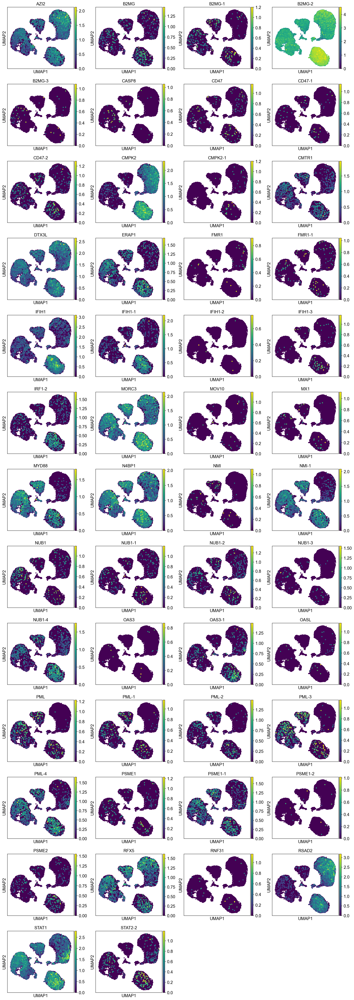

In [25]:
sc.pl.umap(adata, color=isg_genes_list, size=50)

#### Dotplot of the ISG genes in expressed in turtle

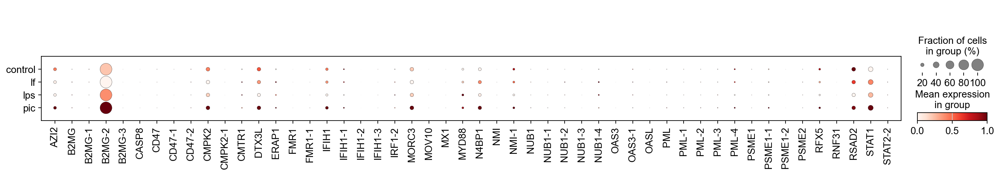

In [26]:
sc.pl.dotplot(adata, isg_genes_list, groupby='treatment', standard_scale='var')

## Gene search tools
This function returns a list of genes that are present in adata (markers for example) from an input of a general list.

In [37]:
def find_gene(gene):
    GENES = list(adata.raw.var.index[adata.raw.var.index.str.startswith(gene.upper())])
    return GENES

find_gene('maf')

['MAF-2', 'MAF1']